In [1]:

import os
import ee
import geemap
import requests
import leafmap
import numpy as np
import pandas as pd
import geopandas as gpd
import concurrent.futures
import matplotlib.pyplot as plt
from shapely.geometry import box  
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed
import concurrent.futures
import ee
import requests
from tqdm import tqdm
import ast

from rasterio.errors import RasterioIOError

import rasterio



In [2]:
# Replace with your actual region
region = "delhi_ncr_small"#lucknow_airshed
# Read metadata
metadata_path = f"/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/raw_data/sentinel_metadata/{region}_sentinel_metadata.geojson"
tif_dir = f"/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/raw_data/setinel_tiles/{region}/"
gdf = gpd.read_file(metadata_path)

# Convert CRS if needed for plotting
# gdf = gdf.to_crs("EPSG:4326")



gdf.crs   

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## visualization of tiles


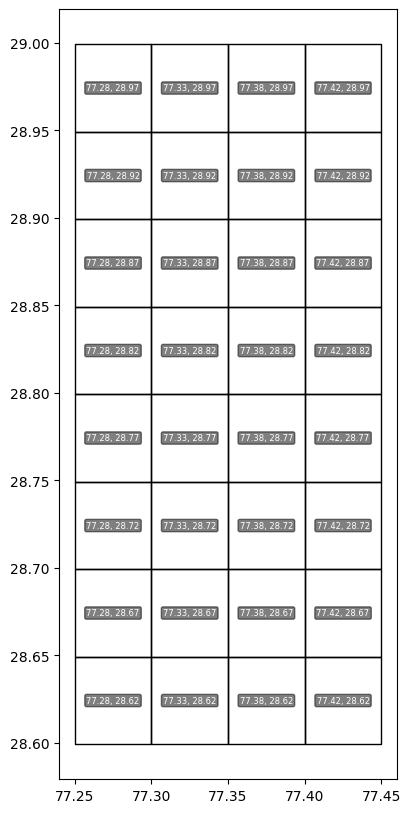

In [3]:



def parse_center(coord_str):
    try:
        return ast.literal_eval(coord_str)
    except Exception:
        return (None, None)
gdf["parsed_center"] = gdf["center_coordinates"].apply(parse_center)

# Check if area_m2 exists; if not, compute it
if 'area_m2' not in gdf.columns:
    gdf['area_m2'] = gdf.to_crs("EPSG:3857").geometry.area

# Plot
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
gdf.plot(ax=ax,edgecolor='black', facecolor='none')

for _, row in gdf.iterrows():
    lon, lat = row["parsed_center"]
    if lon and lat:
        label = f"{lon:.2f}, {lat:.2f}"
        ax.annotate(label, (lon, lat), fontsize=6, color="white",
                    ha="center", va="center", bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2"))

## Tile Cutting

                                            geometry
0  POLYGON ((77.2625 28.59925, 77.2625 28.61175, ...
1  POLYGON ((77.275 28.59925, 77.275 28.61175, 77...
2  POLYGON ((77.2875 28.59925, 77.2875 28.61175, ...
3  POLYGON ((77.3 28.59925, 77.3 28.61175, 77.287...
4  POLYGON ((77.2625 28.61175, 77.2625 28.62425, ...


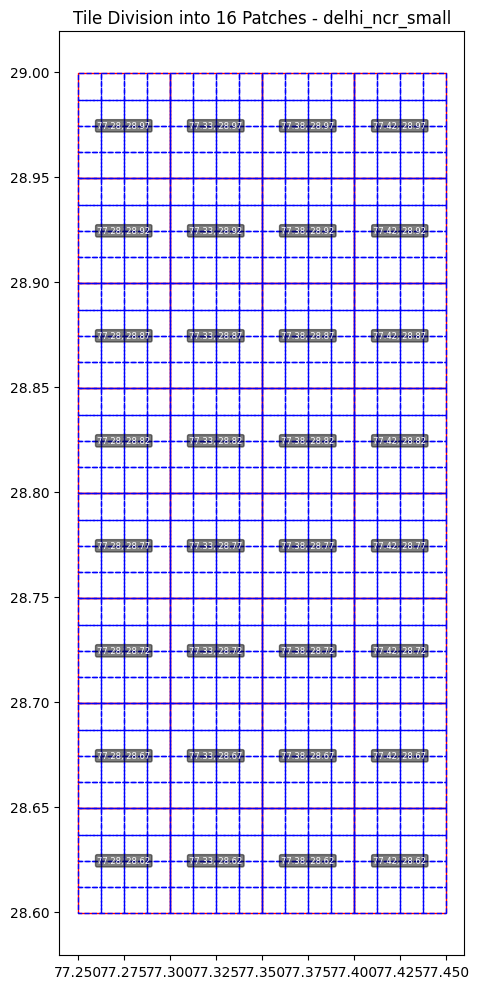

In [4]:

# Parse center coordinates from string to tuple
def parse_center(coord_str):
    try:
        return ast.literal_eval(coord_str)
    except Exception:
        return (None, None)

gdf["parsed_center"] = gdf["center_coordinates"].apply(parse_center)

# Prepare to store patches
patches = []

# Loop through each tile geometry
for _, row in gdf.iterrows():
    tile_geom = row.geometry
    minx, miny, maxx, maxy = tile_geom.bounds

    # Define split size for 8 patches (2 rows x 4 columns)
    rows, cols = 4, 4
    dx = (maxx - minx) / cols
    dy = (maxy - miny) / rows

    for i in range(rows):
        for j in range(cols):
            patch = box(minx + j*dx, miny + i*dy, minx + (j+1)*dx, miny + (i+1)*dy)
            patches.append(patch)

# Create a GeoDataFrame for patches
patches_gdf = gpd.GeoDataFrame(geometry=patches, crs="EPSG:4326")
print(patches_gdf.head())   

# Plotting the original tiles and the 8 patches
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1)
patches_gdf.plot(ax=ax, edgecolor='blue', facecolor='none', linestyle='--')

# Annotate center coordinates
for _, row in gdf.iterrows():
    lon, lat = row["parsed_center"]
    if lon and lat:
        label = f"{lon:.2f}, {lat:.2f}"
        ax.annotate(label, (lon, lat), fontsize=6, color="white",
                    ha="center", va="center", bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2"))

plt.title(f"Tile Division into 16 Patches - {region}")
plt.tight_layout()
plt.show()


## visualization of tile cutting with overlap

100%|██████████| 33/33 [00:00<00:00, 220.91it/s]


                                            geometry
0  POLYGON ((77.41169 28.7875, 77.41169 28.79927,...
1  POLYGON ((77.42067 28.7875, 77.42067 28.79927,...
2  POLYGON ((77.42966 28.7875, 77.42966 28.79927,...
3  POLYGON ((77.43864 28.7875, 77.43864 28.79927,...
4  POLYGON ((77.44762 28.7875, 77.44762 28.79927,...


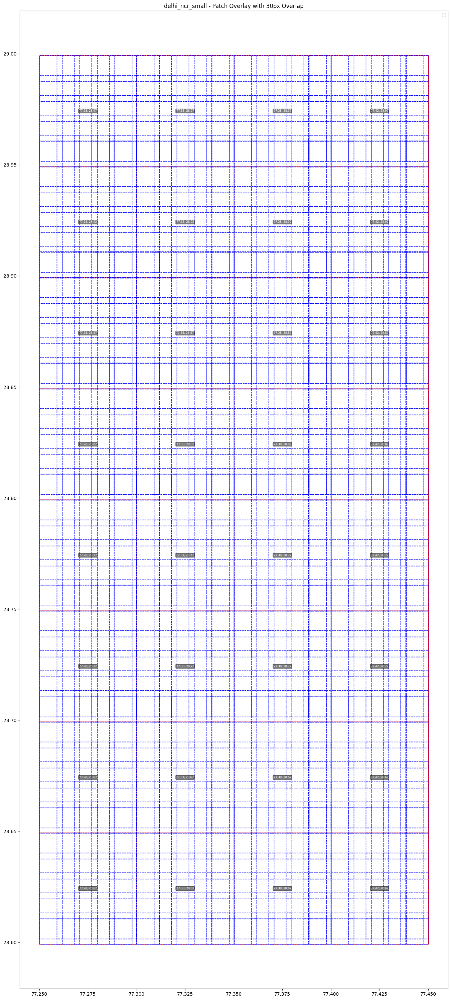

In [5]:
patch_size = 130
overlap = 30
stride = patch_size - overlap

# === Load tile metadata ===
gdf = gpd.read_file(metadata_path)
gdf = gdf.to_crs("EPSG:4326")

def parse_center(coord_str):
    try:
        return ast.literal_eval(coord_str)
    except:
        return (None, None)

gdf["parsed_center"] = gdf["center_coordinates"].apply(parse_center)

# === Generate patch polygons ===
all_patches = []

for tif_name in tqdm(os.listdir(tif_dir)):
    if not tif_name.endswith(".tif"):
        continue

    tif_path = os.path.join(tif_dir, tif_name)

    try:

        with rasterio.open(tif_path) as src:
            width, height = src.width, src.height
            transform = src.transform

            # Ensure complete coverage with overlap
            x_centers = []
            x = 0
            while x + patch_size <= width:
                x_centers.append(x + patch_size // 2)
                x += stride
            if x_centers[-1] + patch_size // 2 < width:
                x_centers.append(width - patch_size // 2)

            y_centers = []
            y = 0
            while y + patch_size <= height:
                y_centers.append(y + patch_size // 2)
                y += stride
            if y_centers[-1] + patch_size // 2 < height:
                y_centers.append(height - patch_size // 2)

            for y in y_centers:
                for x in x_centers:
                    x0 = x - patch_size // 2
                    y0 = y - patch_size // 2
                    x1 = x0 + patch_size
                    y1 = y0 + patch_size

                    # Convert pixel coordinates to lat/lon bounds
                    lon_min, lat_max = rasterio.transform.xy(transform, y0, x0, offset='ul')
                    lon_max, lat_min = rasterio.transform.xy(transform, y1, x1, offset='lr')

                    poly = box(lon_min, lat_min, lon_max, lat_max)
                    all_patches.append(poly)

    except RasterioIOError as e:
        print(f"⚠️ Skipping unsupported file: {tif_path} — {e}")
        continue
    except Exception as e:
        print(f"⚠️ Unexpected error with file {tif_path}: {e}")
        continue                


# === Create GeoDataFrame of patches ===
patches_gdf = gpd.GeoDataFrame(geometry=all_patches, crs="EPSG:4326")
print(patches_gdf.head())
# === Plot patches over original tiles ===
fig, ax = plt.subplots(1, 1, figsize=(30, 30))
gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1, label="Original Tiles")
patches_gdf.plot(ax=ax, edgecolor='blue', facecolor='none', linestyle='--', label="Patches")

# Annotate center coordinates
for _, row in gdf.iterrows():
    lon, lat = row["parsed_center"]
    if lon and lat:
        label = f"{lon:.2f}, {lat:.2f}"
        ax.annotate(label, (lon, lat), fontsize=6, color="white",
                    ha="center", va="center", bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2"))

plt.title(f"{region} - Patch Overlay with {overlap}px Overlap")
plt.legend()
plt.tight_layout()
plt.show()


In [9]:
# === Visualization in Leafmap ===
m = leafmap.Map()
m.add_basemap("HYBRID")

# Add original tiles (red outlines)
m.add_gdf(gdf, layer_name="Original Tiles", style={"color": "red", "weight": 2, "fillOpacity": 0})

# Add patch overlays (blue outlines)
m.add_gdf(patches_gdf, layer_name="Patches", style={"color": "blue", "weight": 1, "dashArray": "5,5", "fillOpacity": 0},zoom_to_layer=True)

# Zoom to data
# m.zoom_to_gdf(patches_gdf)

# m

In [7]:
patch_size = 130
overlap = 30
stride = patch_size - overlap

# === Load tile metadata ===
gdf = gpd.read_file(metadata_path)
gdf = gdf.to_crs("EPSG:4326")

def parse_center(coord_str):
    try:
        return ast.literal_eval(coord_str)
    except:
        return (None, None)

gdf["parsed_center"] = gdf["center_coordinates"].apply(parse_center)

# === Patch Generation & Visualization ===
patch_records = []
tif_files = sorted([f for f in os.listdir(tif_dir) if f.endswith(".tif")])  

for tif_name in tqdm(tif_files):
    tif_path = os.path.join(tif_dir, tif_name)

    with rasterio.open(tif_path) as src:
        width, height = src.width, src.height
        transform = src.transform

        x_centers = []
        x = 0
        while x + patch_size <= width:
            x_centers.append(x + patch_size // 2)
            x += stride
        if x_centers[-1] + patch_size // 2 < width:
            x_centers.append(width - patch_size // 2)

        y_centers = []
        y = 0
        while y + patch_size <= height:
            y_centers.append(y + patch_size // 2)
            y += stride
        if y_centers[-1] + patch_size // 2 < height:
            y_centers.append(height - patch_size // 2)

        # # === Read RGB bands ===
        # img = src.read([1, 2, 3])
        # img = np.transpose(img, (1, 2, 0))
        # img = (img - img.min()) / (img.max() - img.min())

        # === Plot Full Tile with Patches ===
        # fig, ax = plt.subplots(1, 1, figsize=(10, 10))
        # ax.imshow(img)
        # ax.set_title(f"All Patches over Tile: {tif_name}")

        for y in y_centers:
            for x in x_centers:
                x0 = x - patch_size // 2
                y0 = y - patch_size // 2
                x1 = x0 + patch_size
                y1 = y0 + patch_size

                # Bounding box in lon/lat
                # Bounding box in lon/lat
                lon_min, lat_max = rasterio.transform.xy(transform, y0, x0, offset='ul')
                lon_max, lat_min = rasterio.transform.xy(transform, y1, x1, offset='lr')
                lon_center = (lon_min + lon_max) / 2
                lat_center = (lat_min + lat_max) / 2

                poly = box(lon_min, lat_min, lon_max, lat_max)

                patch_records.append({
                    "tile_name": tif_name,
                    "lon_center": lon_center,
                    "lat_center": lat_center,
                    "geometry": poly
                })

                # # Draw patch box
                # ax.add_patch(plt.Rectangle((x0, y0), patch_size, patch_size,
                #                         edgecolor='cyan', facecolor='none', linewidth=0.8))

                # # Draw center coordinates on the image
                # text_str = f"{lat_center:.4f}, {lon_center:.4f}"
                # ax.text(x, y, text_str, fontsize=6, color='yellow',
                #         ha='center', va='center', bbox=dict(boxstyle="round,pad=0.1", fc="black", alpha=0.5))

# # === Save Patch Metadata ===
patches_gdf = gpd.GeoDataFrame(patch_records, crs="EPSG:4326")
patches_gdf.to_file(f"{region}_patch_centers.geojson", driver="GeoJSON")
patches_gdf[["tile_name", "lon_center", "lat_center"]].to_csv(f"{region}_patch_centers.csv", index=False)

print(f"Saved {len(patches_gdf)} patches.")


100%|██████████| 32/32 [00:00<00:00, 293.14it/s]

Saved 1152 patches.


In [11]:
potential_image_shape=gpd.read_file(f"{region}_patch_centers.geojson")
print(potential_image_shape.head(2))

         tile_name  lon_center  lat_center  \
0  77.28_28.62.tif   77.255878   28.643457   
1  77.28_28.62.tif   77.264861   28.643457   

                                            geometry  
0  POLYGON ((77.26176 28.63757, 77.26176 28.64934...  
1  POLYGON ((77.27075 28.63757, 77.27075 28.64934...  


In [8]:
potential_image_shape=gpd.read_file(f"{region}_patch_centers.geojson")
print("Original CRS:", potential_image_shape.crs)
potential_image_shape = potential_image_shape.to_crs("EPSG:3857")
print("Updated CRS:", potential_image_shape.crs)
# #plot that 
# fig,ax=plt.subplots(1,1,figsize=(4,4))
# potential_image_shape.plot(ax=ax,edgecolor='red',facecolor='none')
# m = leafmap.Map()
# m.add_basemap("HYBRID")
# m.add_gdf(potential_image_shape, layer_name="Patch Geometry",zoom_to_layer=True)
# m


Original CRS: EPSG:4326
Updated CRS: EPSG:3857


## save patch 

In [13]:
import os
import ast
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import rasterio
from rasterio.errors import RasterioIOError
from shapely.geometry import box
from tqdm import tqdm

patch_save_path = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel_2"
# Output directories for different composites
save_dirs = {
    "rgb": f"{patch_save_path}/{region}/rgb",
    "color_infrared": f"{patch_save_path}/{region}/color_infrared",
    "geology": f"{patch_save_path}/{region}/geology",
    "agriculture": f"{patch_save_path}/{region}/agriculture",
    "short_wave": f"{patch_save_path}/{region}/short_wave"
}
for path in save_dirs.values():
    os.makedirs(path, exist_ok=True)

# === Load tile metadata ===
gdf = gpd.read_file(metadata_path)
gdf = gdf.to_crs("EPSG:4326")

def parse_center(coord_str):
    try:
        return ast.literal_eval(coord_str)
    except:
        return (None, None)

gdf["parsed_center"] = gdf["center_coordinates"].apply(parse_center)

# === Patch Generation & Saving ===
patch_records = []
tif_files = sorted([f for f in os.listdir(tif_dir) if f.endswith(".tif")])  # process first tile

for tif_name in tqdm(tif_files, desc="Processing Sentinel Tiles"):
    tif_path = os.path.join(tif_dir, tif_name)

    try:
        with rasterio.open(tif_path) as src:
            width, height = src.width, src.height
            transform = src.transform

            x_centers, y_centers = [], []
            x, y = 0, 0
            while x + patch_size <= width:
                x_centers.append(x + patch_size // 2)
                x += stride
            if x_centers[-1] + patch_size // 2 < width:
                x_centers.append(width - patch_size // 2)

            while y + patch_size <= height:
                y_centers.append(y + patch_size // 2)
                y += stride
            if y_centers[-1] + patch_size // 2 < height:
                y_centers.append(height - patch_size // 2)

            for yc in y_centers:
                for xc in x_centers:
                    x0, y0 = xc - patch_size // 2, yc - patch_size // 2
                    x1, y1 = x0 + patch_size, y0 + patch_size

                    lon_min, lat_max = rasterio.transform.xy(transform, y0, x0, offset='ul')
                    lon_max, lat_min = rasterio.transform.xy(transform, y1, x1, offset='lr')
                    lon_center = round((lon_min + lon_max) / 2, 4)
                    lat_center = round((lat_min + lat_max) / 2, 4)

                    poly = box(lon_min, lat_min, lon_max, lat_max)
                    patch_records.append({
                        "tile_name": tif_name,
                        "lon_center": lon_center,
                        "lat_center": lat_center,
                        "geometry": poly
                    })

                    # === Read and normalize bands ===
                    try:
                        red = src.read(1)[y0:y1, x0:x1]
                        green = src.read(2)[y0:y1, x0:x1]
                        blue = src.read(3)[y0:y1, x0:x1]
                        nir = src.read(4)[y0:y1, x0:x1]
                        swir11 = src.read(5)[y0:y1, x0:x1]
                        swir12 = src.read(6)[y0:y1, x0:x1]
                    except:
                        print(f"Band reading failed for patch at {tif_name}, skipping.")
                        continue

                    def norm(band):
                        return ((band - band.min()) / (band.max() - band.min() + 1e-5) * 255).astype(np.uint8)

                    red_norm = norm(red)
                    green_norm = norm(green)
                    blue_norm = norm(blue)
                    nir_norm = norm(nir)
                    swir11_norm = norm(swir11)
                    swir12_norm = norm(swir12)

                    rgb = np.dstack((red_norm, green_norm, blue_norm)).astype(np.uint8)
                    color_infrared = np.dstack((nir_norm, red_norm, green_norm)).astype(np.uint8)
                    geology = np.dstack((swir12_norm, swir11_norm, blue_norm)).astype(np.uint8)
                    agriculture = np.dstack((swir11_norm, nir_norm, blue_norm)).astype(np.uint8)
                    short_wave = np.dstack((swir12_norm, nir_norm, red_norm)).astype(np.uint8)

                    composites = {
                        "rgb": rgb,
                        "color_infrared": color_infrared,
                        "geology": geology,
                        "agriculture": agriculture,
                        "short_wave": short_wave
                    }

                    patch_id = f"{lat_center:.4f}_{lon_center:.4f}"
                    for name, patch_img in composites.items():
                        save_path = os.path.join(save_dirs[name], f"{patch_id}.png")
                        plt.imsave(save_path, patch_img)

    except RasterioIOError:
        print(f"Skipped unsupported file: {tif_path}")
        continue


Processing Sentinel Tiles:   0%|          | 0/32 [00:00<?, ?it/s]

Processing Sentinel Tiles: 100%|██████████| 32/32 [00:54<00:00,  1.69s/it]


## extra code 

## Label Processing

In [9]:
statename="india_v4"
label_path=f"/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/after_hand_validation_data/india_v4/final/{statename}.geojson"
gdf_labels = gpd.read_file(label_path).drop("style", errors="ignore", axis=1)

color_mapping = {"CFCBK": "red", "FCBK": "orange", "Zigzag": "green"}
gdf_labels["style"] = gdf_labels["class_name"].apply(lambda x: {"color": color_mapping[x]})

In [10]:
gdf_labels_webm=gdf_labels.to_crs(potential_image_shape.crs)
gdf_labels_webm.reset_index(inplace=True, drop=True)
print(gdf_labels_webm.crs)
print("Number of labels:", len(gdf_labels_webm))

gdf_labels_webm.head(2)

EPSG:3857
Number of labels: 40728


,class_name,confidence,max_lon,min_lon,max_lat,min_lat,center_lat,center_lon,width_of_box,height_of_box,...,y,yolo_label,label_index,Name,Description,image_center_lat,image_center_lon,view_index,geometry,style
0,Zigzag,0.875191,76.814466,76.812802,29.027524,29.026580,29.027052,76.813634,162.093489,104.604466,...,NaN,None,NaN,None,None,NaN,NaN,NaN,"POLYGON ((8550946.461 3379029.508, 8550947.241...",{'color': 'green'}
1,Zigzag,0.862482,77.411585,77.409582,27.903229,27.902481,27.902855,77.410584,197.219040,82.939175,...,NaN,None,NaN,None,None,NaN,NaN,NaN,"POLYGON ((8617195.251 3236777.516, 8617195.696...",{'color': 'green'}


In [11]:
# print(labels_gdf["geometry"][0])
#change the crs

In [12]:
images_with_label=gpd.sjoin(potential_image_shape,gdf_labels_webm,predicate="contains")
images_with_label['geometry_right'] = images_with_label['index_right'].apply(lambda x: gdf_labels_webm.loc[x, 'geometry'])
print(f"Number of labels to write: {len(images_with_label)}")
print(f"Number of unique images: {len(images_with_label.drop_duplicates(subset='geometry'))}")
print(f"Number of unique labels: {len(images_with_label.drop_duplicates(subset='geometry_right'))}")

Number of labels to write: 503
Number of unique images: 227
Number of unique labels: 302


In [13]:
images_with_label.head(2)

,tile_name,lon_center,lat_center,geometry,index_right,class_name,confidence,max_lon,min_lon,max_lat,...,y,yolo_label,label_index,Name,Description,image_center_lat,image_center_lon,view_index,style,geometry_right
147,77.28_28.82.tif,77.282827,28.843422,"POLYGON ((8603740 3354984.416, 8603740 3356479...",34137,Zigzag,0.887751,77.286159,77.285575,28.848535,...,NaN,None,NaN,None,None,28.85,77.28,NaN,{'color': 'green'},POLYGON ((8603514.753258606 3356266.2426205873...
148,77.28_28.82.tif,77.291811,28.843422,"POLYGON ((8604740 3354984.416, 8604740 3356479...",16750,Zigzag,0.957785,77.292139,77.290775,28.846965,...,NaN,None,NaN,None,None,28.85,77.29,7624.0,{'color': 'green'},POLYGON ((8604076.360089658 3356038.4980663643...


In [14]:
gdf_labels_webm["geometry"]
class_mapping = {"CFCBK": 0, "FCBK": 1, "Zigzag": 2}
def get_yolo_label(x):
    image_polygon=x['geometry']
    label_polygon=x['geometry_right']
    min_x, min_y, max_x, max_y = image_polygon.bounds
    coords = np.array(label_polygon.__geo_interface__['coordinates'][0][:-1])  
    coords[:, 0] = (coords[:, 0] - min_x) / (max_x - min_x)
    coords[:, 1] = 1 - (coords[:, 1] - min_y) / (max_y - min_y)
    coords = coords.ravel()
    assert len(coords) == 8
    class_id = class_mapping[x['class_name']]
    label = np.zeros(9) * np.nan
    label[0] = class_mapping.get(x['class_name'],-1)
    label[1:] = coords
    return label

In [15]:
images_with_label['yolo_label_s'] = images_with_label.apply(get_yolo_label, axis=1)
images_with_label.head(2)

,tile_name,lon_center,lat_center,geometry,index_right,class_name,confidence,max_lon,min_lon,max_lat,...,yolo_label,label_index,Name,Description,image_center_lat,image_center_lon,view_index,style,geometry_right,yolo_label_s
147,77.28_28.82.tif,77.282827,28.843422,"POLYGON ((8603740 3354984.416, 8603740 3356479...",34137,Zigzag,0.887751,77.286159,77.285575,28.848535,...,None,NaN,None,None,28.85,77.28,NaN,{'color': 'green'},POLYGON ((8603514.753258606 3356266.2426205873...,"[2.0, 0.8280559225988979, 0.1428967930992432, ..."
148,77.28_28.82.tif,77.291811,28.843422,"POLYGON ((8604740 3354984.416, 8604740 3356479...",16750,Zigzag,0.957785,77.292139,77.290775,28.846965,...,None,NaN,None,None,28.85,77.29,7624.0,{'color': 'green'},POLYGON ((8604076.360089658 3356038.4980663643...,"[2.0, 0.4934046485930417, 0.2951798981274627, ..."


In [16]:
print("Total geometries:", len(images_with_label['geometry_right']))
geometry_gdf = gpd.GeoDataFrame(geometry=images_with_label['geometry_right'],crs="EPSG:3857" )
geometry_gdf = geometry_gdf.to_crs("EPSG:4326")
m = leafmap.Map()
m.add_basemap("HYBRID")
m.add_gdf(geometry_gdf, layer_name="Detected Bounding Boxes",zoom_to_layer=True)    
m


Total geometries: 503


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [17]:
def has_negative(label):
    return np.any(label < 0)

# Filter rows where any value in label is negative (excluding class_id if needed)
negatives = images_with_label[images_with_label['yolo_label_s'].apply(has_negative)]

print(f"Found {len(negatives)} entries with negative values in YOLO-OBB labels.")
if len(negatives) > 0:
    print(negatives[['lat_center', 'lon_center', 'yolo_label']].head())


Found 0 entries with negative values in YOLO-OBB labels.


In [18]:
# Group by lon_center and lat_center
grouped = images_with_label.groupby(['lon_center', 'lat_center'])
grouped_counts = grouped.size().reset_index(name='count')
print(grouped_counts)

     lon_center  lat_center  count
0     77.255878   28.884475      3
1     77.255878   28.893458      5
2     77.255878   28.905046      1
3     77.255878   28.907471      1
4     77.255878   28.916455      3
..          ...         ...    ...
222   77.444255   28.957508      3
223   77.444255   28.966491      3
224   77.444255   28.975474      2
225   77.444255   28.984457      1
226   77.444255   28.993440      4

[227 rows x 3 columns]


In [19]:
from os.path import join
import glob

save_dir= f"/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel_2/{region}"

label_dir_path = join(save_dir, "labels")
print(f"Creating directory: {label_dir_path}")
os.makedirs(label_dir_path, exist_ok=True)
grouped = images_with_label.groupby(['lat_center', 'lon_center'])
for (lat_center, lon_center), group in grouped:
    labels = np.vstack(group['yolo_label_s'].values)  # stack all label rows
    save_path = join(label_dir_path, f"{lat_center:.4f}_{lon_center:.4f}.txt")
    np.savetxt(save_path, labels, fmt="%d %f %f %f %f %f %f %f %f")

print(f"Saved {len(grouped)} YOLO-OBB label files to: {label_dir_path}")

label_files = glob.glob(os.path.join(label_dir_path, "*.txt"))

bad_files = []
for file in label_files:
    data = np.loadtxt(file, ndmin=2)  
    if np.any(data[:, 1:] < 0): 
        bad_files.append(file)

print(f"Found {len(bad_files)} files with negative label coordinates.")
if bad_files:
    print("Examples:", bad_files[:5])


Creating directory: /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel_2/delhi_ncr_small/labels
Saved 227 YOLO-OBB label files to: /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel_2/delhi_ncr_small/labels
Found 0 files with negative label coordinates.


In [20]:
potential_image_shape=gpd.read_file(f"{region}_patch_centers.geojson")
print("Original CRS:", potential_image_shape.crs)
potential_image_shape = potential_image_shape.to_crs("EPSG:3857")
print("Updated CRS:", potential_image_shape.crs)

m = leafmap.Map()
m.add_basemap("HYBRID")
# m.add_gdf(potential_image_shape, layer_name="Patch Geometry",zoom_to_layer=True)
m.add_gdf(
    potential_image_shape,
    layer_name="Patch Geometry",
    zoom_to_layer=False,
    style={
        "color": "black",       # border color
        "fillColor": "transparent",  # transparent fill
        "weight": 1.5,          # border thickness
        "fillOpacity": 0        # ensure fill is invisible
    }
)
# m.add_gdf(geometry_gdf, layer_name="Detected Bounding Boxes",zoom_to_layer=True)
m.add_gdf(
    geometry_gdf,
    layer_name="Detected Bounding Boxes",
    style={
        "color": "red",       # border color
        "fillColor": "transparent",  # transparent fill
        "weight": 2.5,          # border thickness
        "fillOpacity": 0.5        # ensure fill is invisible
    },
    zoom_to_layer=True,
    legend_title="Brick Kiln Class"
)
m

Original CRS: EPSG:4326
Updated CRS: EPSG:3857


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [71]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from glob import glob
from os.path import join, splitext, basename

# CONFIGURATION
label_dir = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel_2/delhi_ncr_small/labels"
image_dir = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel_2/delhi_ncr_small/rgb"
image_size = 130  # Sentinel image size in pixels
NUM_IMAGES_TO_SHOW = 240

# LOAD LABEL FILES
label_files = glob(join(label_dir, "*.txt"))
selected_label_files = np.random.choice(label_files, size=min(NUM_IMAGES_TO_SHOW, len(label_files)), replace=False)

# PLOT MULTIPLE IMAGES
cols = 6
rows = int(np.ceil(len(selected_label_files) / cols))
plt.figure(figsize=(cols * 5, rows * 5))

for i, label_file in enumerate(selected_label_files, start=1):
    base = splitext(basename(label_file))[0]
    image_file = join(image_dir, base + ".png")

    if not os.path.exists(image_file):
        print(f"🚫 Image not found: {image_file}")
        continue

    try:
        # Load image and labels
        image = Image.open(image_file).convert("RGB")
        image_np = np.array(image)
        labels = np.loadtxt(label_file, ndmin=2)

        # Plot
        plt.subplot(rows, cols, i)
        plt.imshow(image_np)
        plt.axis("off")
        plt.title(f"{base}", fontsize=12)

        for label in labels:
            class_id = int(label[0])
            coords = label[1:] * image_size
            coords = coords.reshape(-1, 2)
            coords = np.vstack([coords, coords[0]])  # close polygon
            plt.plot(coords[:, 0], coords[:, 1], 'r-', linewidth=2)
            plt.text(coords[0, 0], coords[0, 1], f"{class_id}", color="yellow", fontsize=8)

    except Exception as e:
        print(f"⚠️ Error with file {label_file}: {e}")

plt.tight_layout()
plt.show()
